### Download celebA datasets from kaggle and via kaggle api

In [1]:
# Upload kaggle.json first
from google.colab import files
files.upload()

# Setup Kaggle API
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Download CelebA dataset
!kaggle datasets download -d jessicali9530/celeba-dataset
!unzip -q celeba-dataset.zip -d celeba


Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/jessicali9530/celeba-dataset
License(s): other
 97% 1.29G/1.33G [00:15<00:00, 165MB/s]
100% 1.33G/1.33G [00:15<00:00, 93.8MB/s]


### Setup

In [2]:
import pandas as pd
import numpy as np
import os
from PIL import Image
import tensorflow as tf

IMG_SIZE = 64
LATENT_DIM = 100
BATCH_SIZE = 64
EPOCHS = 100

### Filter Long Hair Images

In [3]:

IMG_DIR = 'celeba/img_align_celeba/img_align_celeba'
ATTR_FILE = 'celeba/list_attr_celeba.csv'

# Load attribute labels
df = pd.read_csv(ATTR_FILE)
df.columns = df.columns.str.strip()
df['image_id'] = df['image_id'].str.strip()

# Use Wavy_Hair attribute: 1 for wavy, -1 for not wavy
wavy_df = df[df['Wavy_Hair'] == 1].sample(n=20000, random_state=42)
non_wavy_df = df[df['Wavy_Hair'] == -1].sample(n=20000, random_state=42)

# Combine and shuffle
mixed_df = pd.concat([wavy_df, non_wavy_df]).sample(frac=1, random_state=42).reset_index(drop=True)

# Store labels: 1 for wavy, 0 for not wavy
labels = (mixed_df['Wavy_Hair'] == 1).astype(np.float32).values.reshape(-1, 1)
image_ids = mixed_df['image_id'].tolist()

# Load and preprocess images
def load_images(image_ids):
    data = []
    for img_id in image_ids:
        path = os.path.join(IMG_DIR, img_id)
        img = Image.open(path).resize((IMG_SIZE, IMG_SIZE)).convert('RGB')
        img = (np.array(img) / 127.5) - 1.0  # Normalize to [-1, 1]
        data.append(img)
    return np.array(data, dtype=np.float32)

images = load_images(image_ids)
conditions = labels  # 1 for Wavy Hair, 0 for Not


### Plot some Long Hair(Wavy Hair) samples

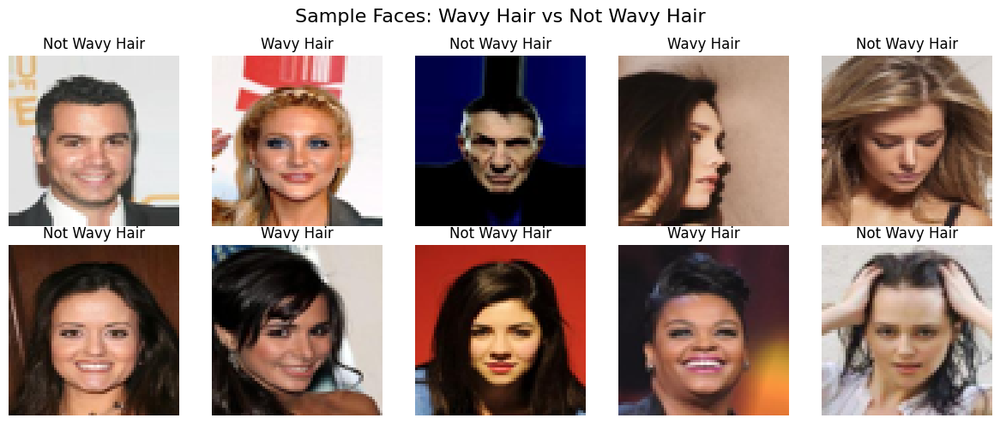

In [7]:
import matplotlib.pyplot as plt

# Pick 10 samples (first 10 or random)
sample_indices = np.arange(10)
sample_images = images[sample_indices]
sample_conditions = conditions[sample_indices]

plt.figure(figsize=(12, 5))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    img = (sample_images[i] + 1) / 2.0  # Rescale to [0, 1]
    plt.imshow(img)
    label = "Wavy Hair" if sample_conditions[i][0] == 1.0 else "Not Wavy Hair"
    plt.title(label)
    plt.axis('off')

plt.suptitle("Sample Faces: Wavy Hair vs Not Wavy Hair", fontsize=16)
plt.tight_layout()
plt.show()


### Build Conditional Generator & Discriminator

In [8]:
def make_generator():
    noise = tf.keras.Input(shape=(LATENT_DIM,))
    label = tf.keras.Input(shape=(1,))
    x = tf.keras.layers.Concatenate()([noise, label]) # (101, )
    x = tf.keras.layers.Dense(8 * 8 * 256, use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU()(x)
    x = tf.keras.layers.Reshape((8, 8, 256))(x)
    x = tf.keras.layers.Conv2DTranspose(128, 4, strides=2, padding='same', use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU()(x)
    x = tf.keras.layers.Conv2DTranspose(64, 4, strides=2, padding='same', use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU()(x)
    x = tf.keras.layers.Conv2DTranspose(3, 4, strides=2, padding='same', activation='tanh')(x)
    return tf.keras.Model([noise, label], x)

def make_discriminator():
    image = tf.keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    label = tf.keras.Input(shape=(1,))
    label_embedding = tf.keras.layers.Dense(IMG_SIZE * IMG_SIZE)(label)
    label_embedding = tf.keras.layers.Reshape((IMG_SIZE, IMG_SIZE, 1))(label_embedding) #(64,64,1)
    x = tf.keras.layers.Concatenate()([image, label_embedding]) #(64,64,4)
    x = tf.keras.layers.Conv2D(64, 4, strides=2, padding='same')(x)
    x = tf.keras.layers.LeakyReLU()(x)
    x = tf.keras.layers.Conv2D(128, 4, strides=2, padding='same')(x)
    x = tf.keras.layers.LeakyReLU()(x)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(1)(x)
    return tf.keras.Model([image, label], x)

generator = make_generator()
discriminator = make_discriminator()

generator.summary()
discriminator.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 100)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_1       │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 101)       │          0 │ input_layer[0][0… │
│ (Concatenate)       │                   │            │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 16384)     │  1,654,784 │ concatenate[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 16384)     │     65,536 │ dense[0][0]       │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu         │ (None, 16384)     │          0 │ batch_normalizat… │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 8, 8, 256) │          0 │ leaky_re_lu[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose    │ (None, 16, 16,    │    524,288 │ reshape[0][0]     │
│ (Conv2DTranspose)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 16, 16,    │        512 │ conv2d_transpose… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_1       │ (None, 16, 16,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_1  │ (None, 32, 32,    │    131,072 │ leaky_re_lu_1[0]… │
│ (Conv2DTranspose)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        256 │ conv2d_transpose… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_2       │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_2  │ (None, 64, 64, 3) │      3,075 │ leaky_re_lu_2[0]… │
│ (Conv2DTranspose)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 2,379,523 (9.08 MB)

 Trainable params: 2,346,371 (8.95 MB)

 Non-trainable params: 33,152 (129.50 KB)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 4096)      │      8,192 │ input_layer_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_2       │ (None, 64, 64, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_1 (Reshape) │ (None, 64, 64, 1) │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 64, 64, 4) │          0 │ input_layer_2[0]… │
│ (Concatenate)       │                   │            │ reshape_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 32, 32,    │      4,160 │ concatenate_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_3       │ (None, 32, 32,    │          0 │ conv2d[0][0]      │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 16, 16,    │    131,200 │ leaky_re_lu_3[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_4       │ (None, 16, 16,    │          0 │ conv2d_1[0][0]    │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 32768)     │          0 │ leaky_re_lu_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 1)         │     32,769 │ flatten[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 176,321 (688.75 KB)

 Trainable params: 176,321 (688.75 KB)

 Non-trainable params: 0 (0.00 B)

### Define Loss, Optimizers, Train Step

In [9]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    return cross_entropy(tf.ones_like(real_output), real_output) + cross_entropy(tf.zeros_like(fake_output), fake_output)

@tf.function
def train_step(images, labels):
    noise = tf.random.normal([tf.shape(images)[0], LATENT_DIM])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated = generator([noise, labels], training=True)
        real_output = discriminator([images, labels], training=True)
        fake_output = discriminator([generated, labels], training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gen_grad = gen_tape.gradient(gen_loss, generator.trainable_variables)
    disc_grad = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    generator_optimizer.apply_gradients(zip(gen_grad, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(disc_grad, discriminator.trainable_variables))

    return gen_loss, disc_loss


### Train the Conditional GAN

Epoch 1/100 | Generator Loss: 2.7488 | Discriminator Loss: 0.5166


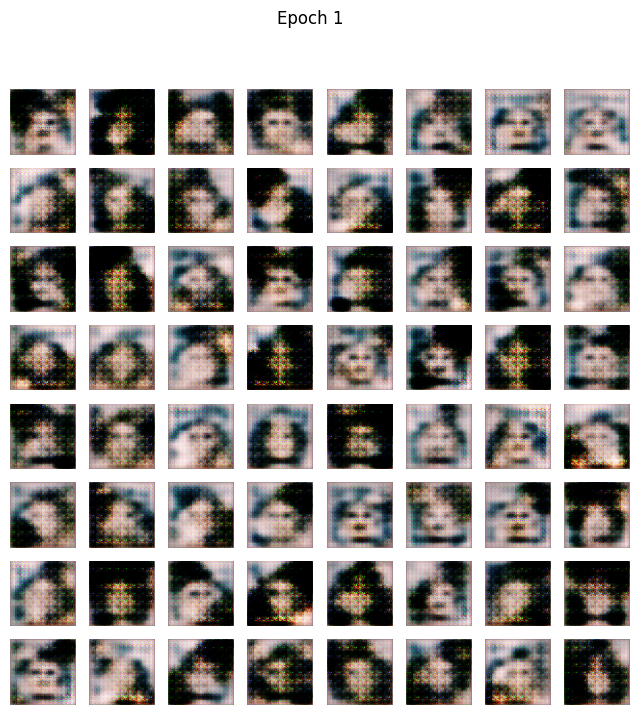

Epoch 2/100 | Generator Loss: 1.2051 | Discriminator Loss: 0.9960
Epoch 3/100 | Generator Loss: 1.0827 | Discriminator Loss: 1.0977
Epoch 4/100 | Generator Loss: 1.1315 | Discriminator Loss: 1.0357
Epoch 5/100 | Generator Loss: 1.1867 | Discriminator Loss: 1.0447


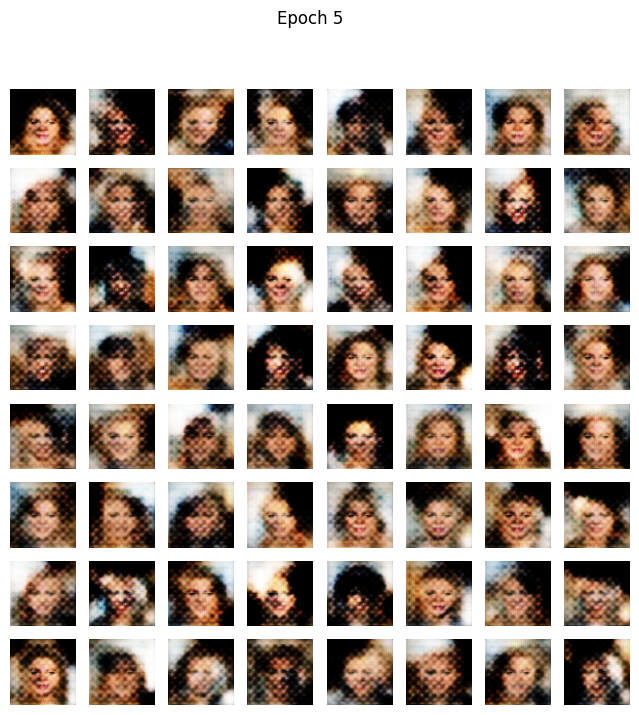

Epoch 6/100 | Generator Loss: 1.1181 | Discriminator Loss: 1.0767
Epoch 7/100 | Generator Loss: 1.1818 | Discriminator Loss: 1.0972
Epoch 8/100 | Generator Loss: 1.1317 | Discriminator Loss: 1.0438
Epoch 9/100 | Generator Loss: 1.1828 | Discriminator Loss: 1.0142
Epoch 10/100 | Generator Loss: 1.2852 | Discriminator Loss: 0.9408


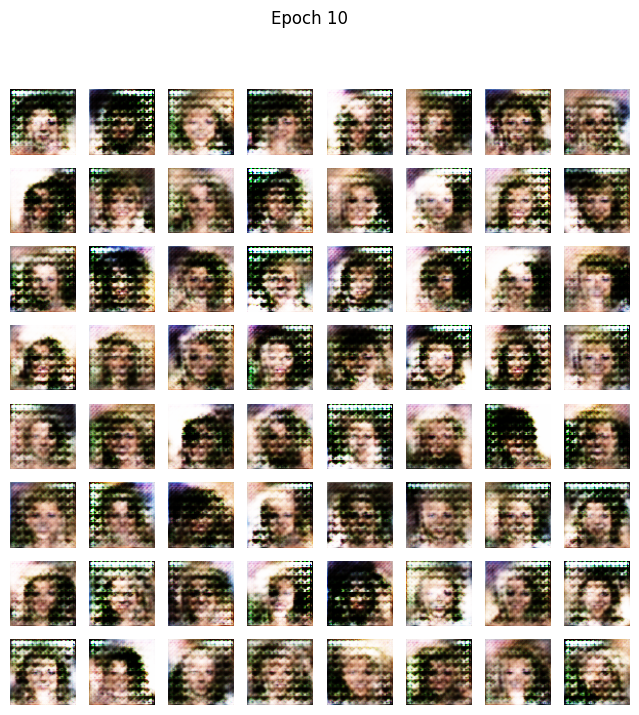

Epoch 11/100 | Generator Loss: 1.3975 | Discriminator Loss: 0.9259
Epoch 12/100 | Generator Loss: 1.2503 | Discriminator Loss: 0.9684
Epoch 13/100 | Generator Loss: 1.3019 | Discriminator Loss: 0.9508
Epoch 14/100 | Generator Loss: 1.2675 | Discriminator Loss: 1.0280
Epoch 15/100 | Generator Loss: 1.1453 | Discriminator Loss: 1.1011


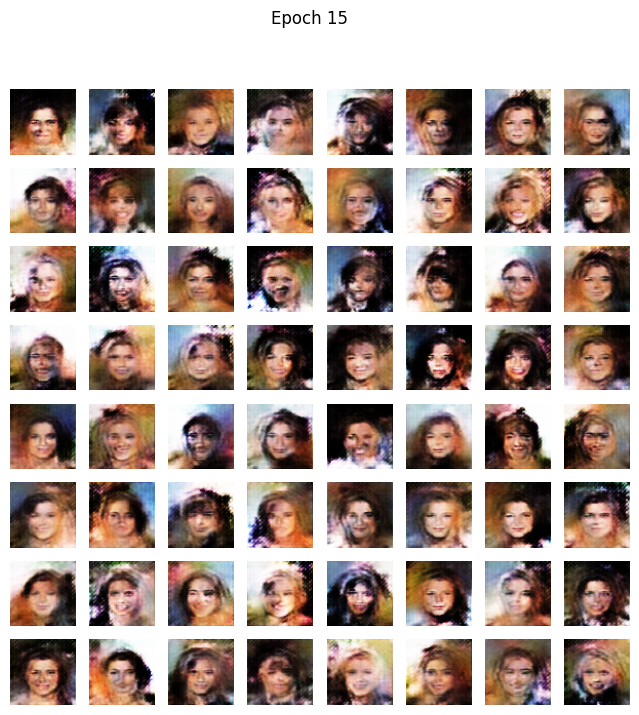

Epoch 16/100 | Generator Loss: 1.1409 | Discriminator Loss: 1.1055
Epoch 17/100 | Generator Loss: 1.1412 | Discriminator Loss: 1.0992
Epoch 18/100 | Generator Loss: 1.1141 | Discriminator Loss: 1.0922
Epoch 19/100 | Generator Loss: 1.1991 | Discriminator Loss: 1.0304
Epoch 20/100 | Generator Loss: 1.1945 | Discriminator Loss: 1.0505


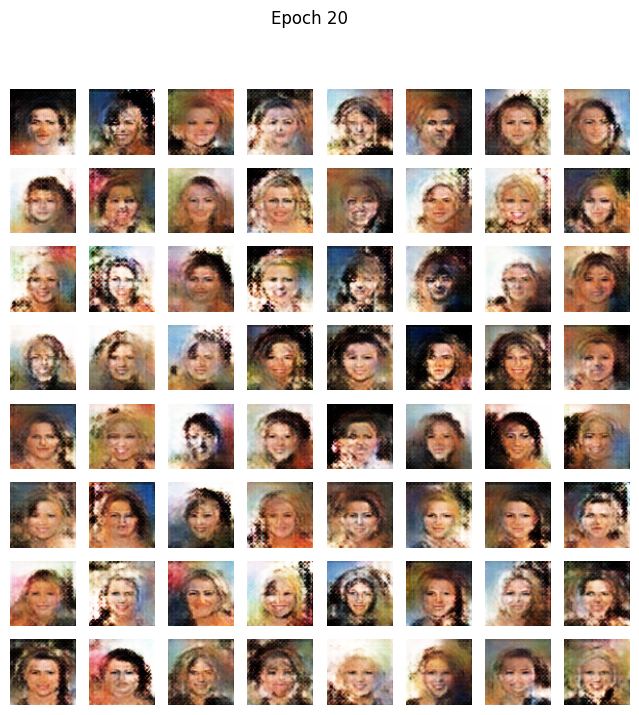

Epoch 21/100 | Generator Loss: 1.2296 | Discriminator Loss: 0.9731
Epoch 22/100 | Generator Loss: 1.2433 | Discriminator Loss: 0.9950
Epoch 23/100 | Generator Loss: 1.2655 | Discriminator Loss: 0.9694
Epoch 24/100 | Generator Loss: 1.3226 | Discriminator Loss: 0.9528
Epoch 25/100 | Generator Loss: 1.3048 | Discriminator Loss: 0.9595


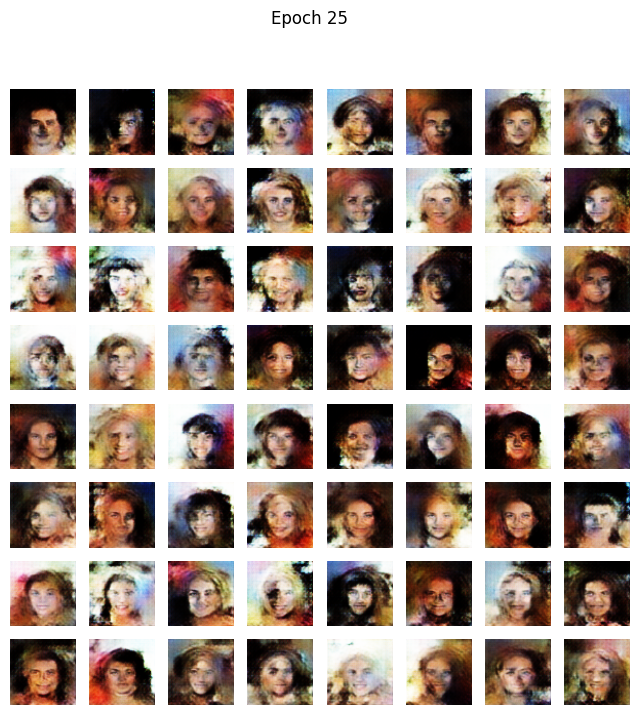

Epoch 26/100 | Generator Loss: 1.3372 | Discriminator Loss: 0.9363
Epoch 27/100 | Generator Loss: 1.3940 | Discriminator Loss: 0.9251
Epoch 28/100 | Generator Loss: 1.3760 | Discriminator Loss: 0.9216
Epoch 29/100 | Generator Loss: 1.3956 | Discriminator Loss: 0.9046
Epoch 30/100 | Generator Loss: 1.4127 | Discriminator Loss: 0.9115


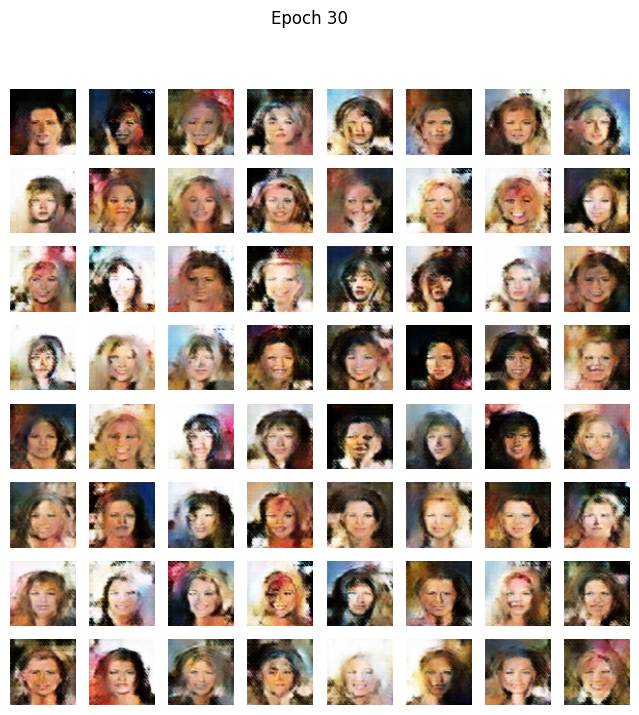

Epoch 31/100 | Generator Loss: 1.3660 | Discriminator Loss: 0.9457
Epoch 32/100 | Generator Loss: 1.4016 | Discriminator Loss: 0.8913
Epoch 33/100 | Generator Loss: 1.4886 | Discriminator Loss: 0.8979
Epoch 34/100 | Generator Loss: 1.3622 | Discriminator Loss: 0.9395
Epoch 35/100 | Generator Loss: 1.4505 | Discriminator Loss: 0.9276


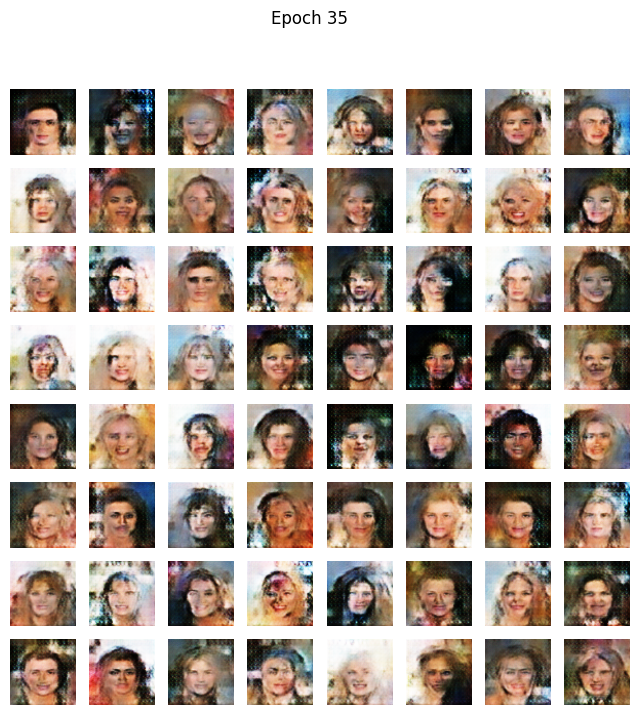

Epoch 36/100 | Generator Loss: 1.4492 | Discriminator Loss: 0.8975
Epoch 37/100 | Generator Loss: 1.4189 | Discriminator Loss: 0.9488
Epoch 38/100 | Generator Loss: 1.5411 | Discriminator Loss: 0.8768
Epoch 39/100 | Generator Loss: 1.4068 | Discriminator Loss: 0.8978
Epoch 40/100 | Generator Loss: 1.5197 | Discriminator Loss: 0.8824


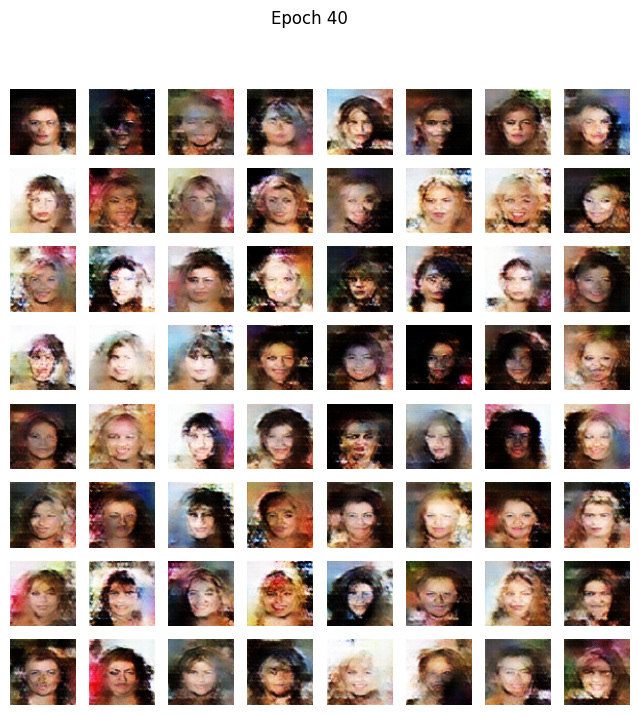

Epoch 41/100 | Generator Loss: 1.5050 | Discriminator Loss: 0.8710
Epoch 42/100 | Generator Loss: 1.4706 | Discriminator Loss: 0.8764
Epoch 43/100 | Generator Loss: 1.5293 | Discriminator Loss: 0.8732
Epoch 44/100 | Generator Loss: 1.5041 | Discriminator Loss: 0.8945
Epoch 45/100 | Generator Loss: 1.4764 | Discriminator Loss: 0.8698


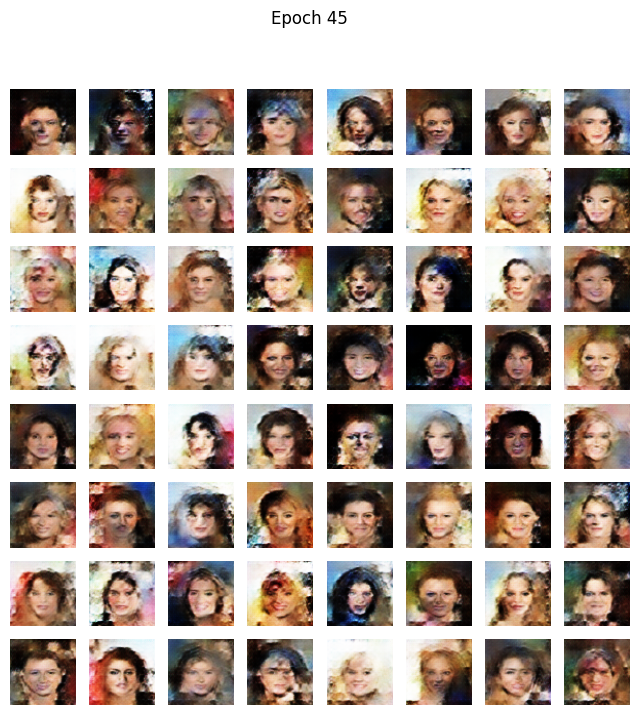

Epoch 46/100 | Generator Loss: 1.5016 | Discriminator Loss: 0.8688
Epoch 47/100 | Generator Loss: 1.8985 | Discriminator Loss: 0.8108
Epoch 48/100 | Generator Loss: 1.5077 | Discriminator Loss: 0.8784
Epoch 49/100 | Generator Loss: 1.4854 | Discriminator Loss: 0.8821
Epoch 50/100 | Generator Loss: 1.6054 | Discriminator Loss: 0.8672


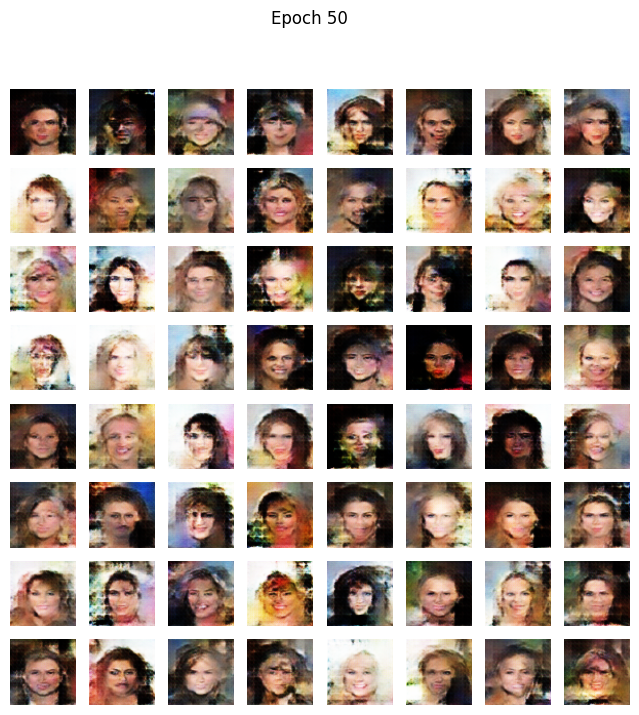

Epoch 51/100 | Generator Loss: 1.5244 | Discriminator Loss: 0.8600
Epoch 52/100 | Generator Loss: 1.5173 | Discriminator Loss: 0.8683
Epoch 53/100 | Generator Loss: 1.5262 | Discriminator Loss: 0.9034
Epoch 54/100 | Generator Loss: 1.5439 | Discriminator Loss: 0.9092
Epoch 55/100 | Generator Loss: 1.4152 | Discriminator Loss: 0.9415


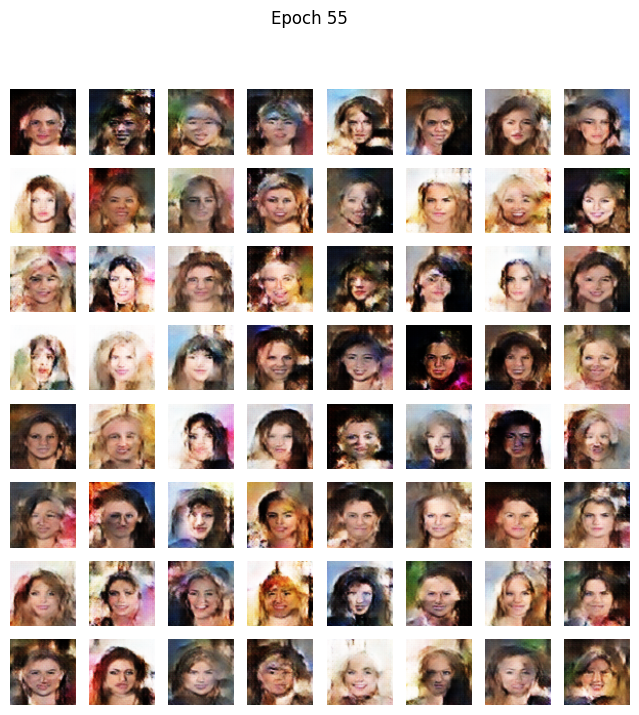

Epoch 56/100 | Generator Loss: 1.4657 | Discriminator Loss: 0.9349
Epoch 57/100 | Generator Loss: 1.4181 | Discriminator Loss: 0.9341
Epoch 58/100 | Generator Loss: 1.4512 | Discriminator Loss: 0.9511
Epoch 59/100 | Generator Loss: 1.4218 | Discriminator Loss: 0.9650
Epoch 60/100 | Generator Loss: 1.4142 | Discriminator Loss: 0.9329


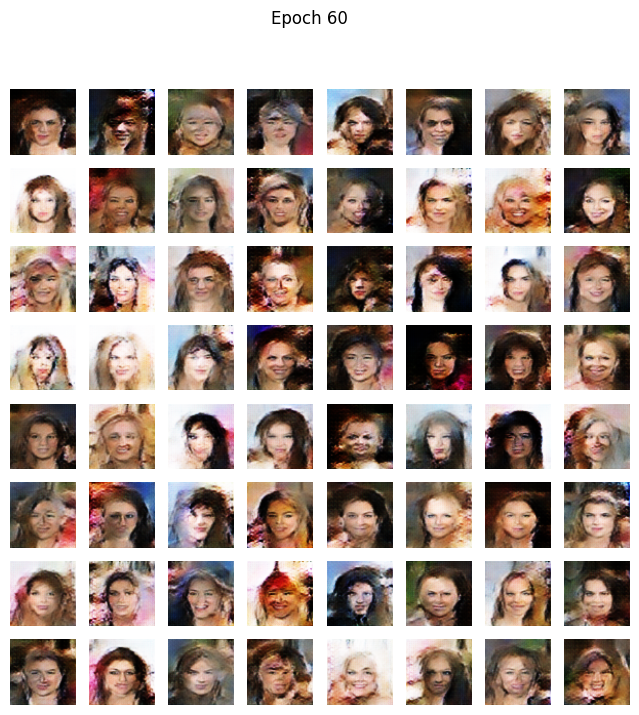

Epoch 61/100 | Generator Loss: 1.4221 | Discriminator Loss: 0.9662
Epoch 62/100 | Generator Loss: 1.4157 | Discriminator Loss: 0.9687
Epoch 63/100 | Generator Loss: 1.4466 | Discriminator Loss: 0.9472
Epoch 64/100 | Generator Loss: 1.3615 | Discriminator Loss: 0.9995
Epoch 65/100 | Generator Loss: 1.4098 | Discriminator Loss: 0.9665


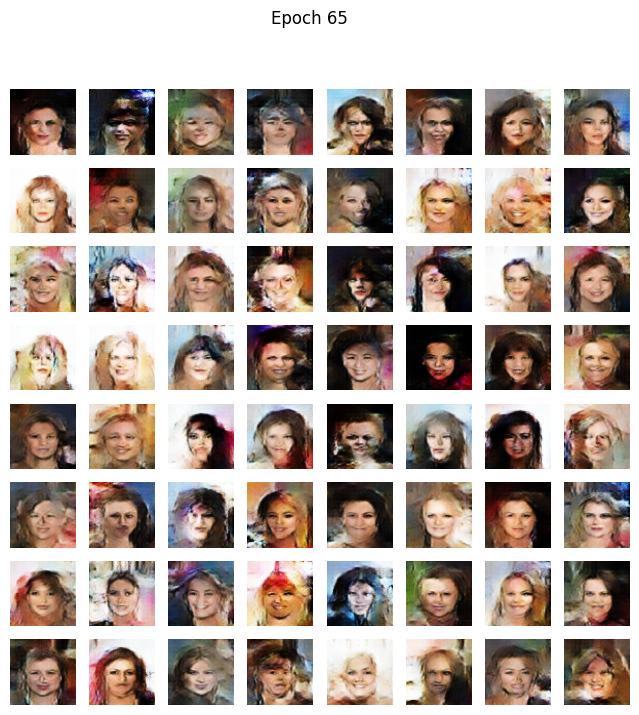

Epoch 66/100 | Generator Loss: 1.3743 | Discriminator Loss: 0.9838
Epoch 67/100 | Generator Loss: 1.3525 | Discriminator Loss: 0.9992
Epoch 68/100 | Generator Loss: 1.3507 | Discriminator Loss: 0.9981
Epoch 69/100 | Generator Loss: 1.3394 | Discriminator Loss: 1.0055
Epoch 70/100 | Generator Loss: 1.3770 | Discriminator Loss: 1.0152


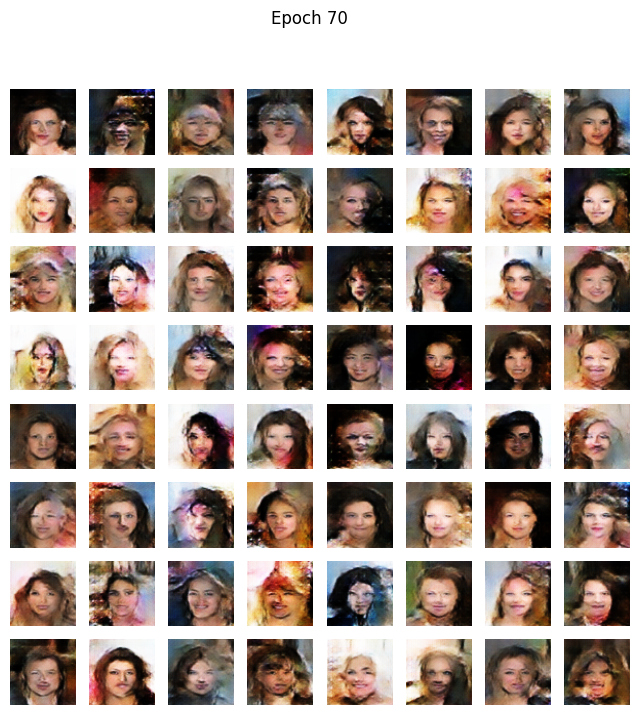

Epoch 71/100 | Generator Loss: 1.3562 | Discriminator Loss: 0.9618
Epoch 72/100 | Generator Loss: 1.3639 | Discriminator Loss: 0.9704
Epoch 73/100 | Generator Loss: 1.3929 | Discriminator Loss: 0.9769
Epoch 74/100 | Generator Loss: 1.3662 | Discriminator Loss: 0.9887
Epoch 75/100 | Generator Loss: 1.4078 | Discriminator Loss: 0.9692


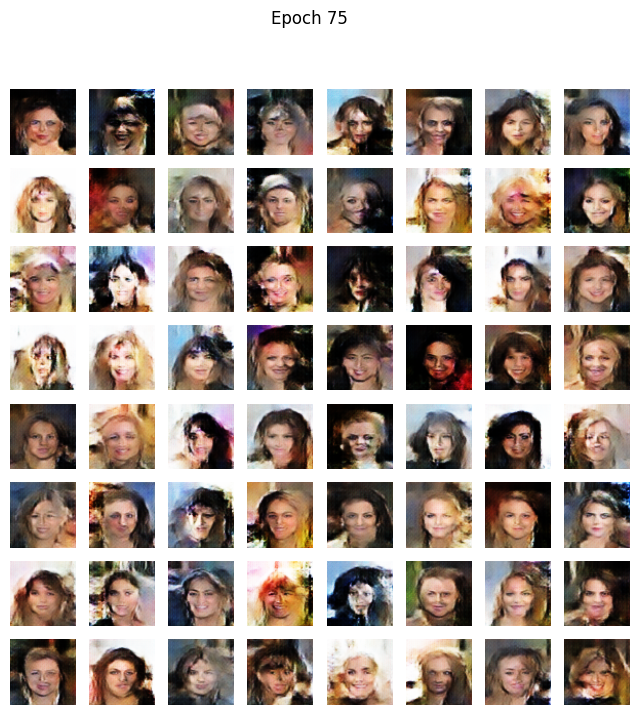

Epoch 76/100 | Generator Loss: 1.3538 | Discriminator Loss: 0.9674
Epoch 77/100 | Generator Loss: 1.3314 | Discriminator Loss: 0.9980
Epoch 78/100 | Generator Loss: 1.3377 | Discriminator Loss: 0.9676
Epoch 79/100 | Generator Loss: 1.3561 | Discriminator Loss: 0.9845
Epoch 80/100 | Generator Loss: 1.3290 | Discriminator Loss: 0.9881


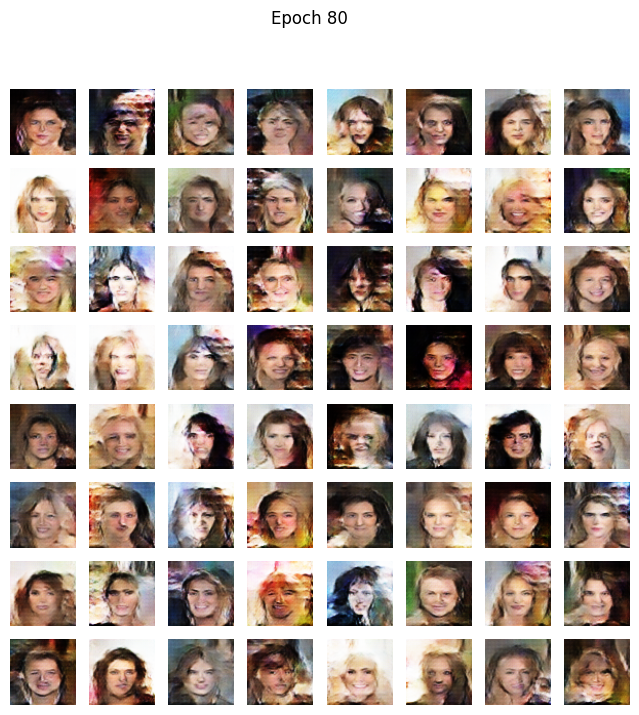

Epoch 81/100 | Generator Loss: 1.3395 | Discriminator Loss: 0.9843
Epoch 82/100 | Generator Loss: 1.3442 | Discriminator Loss: 0.9631
Epoch 83/100 | Generator Loss: 1.2769 | Discriminator Loss: 0.9904
Epoch 84/100 | Generator Loss: 1.2890 | Discriminator Loss: 0.9779
Epoch 85/100 | Generator Loss: 1.3091 | Discriminator Loss: 0.9815


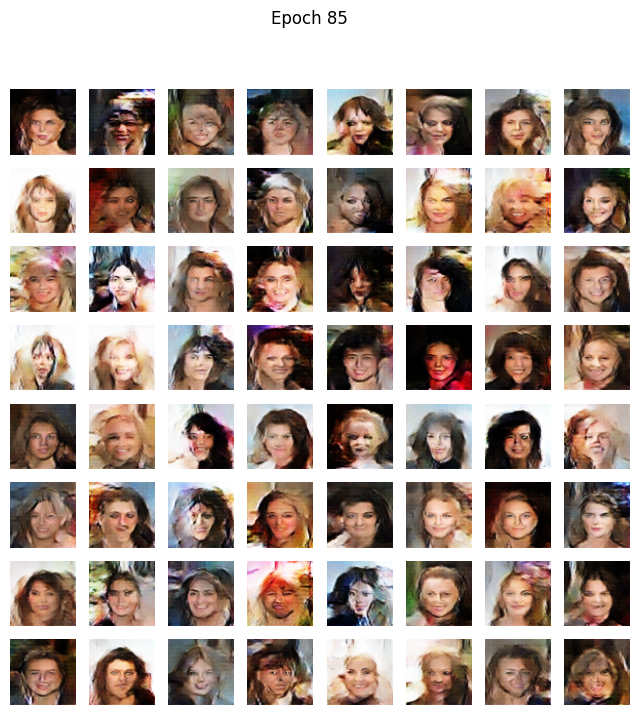

Epoch 86/100 | Generator Loss: 1.2754 | Discriminator Loss: 0.9843
Epoch 87/100 | Generator Loss: 1.3051 | Discriminator Loss: 0.9849
Epoch 88/100 | Generator Loss: 1.2654 | Discriminator Loss: 1.0123
Epoch 89/100 | Generator Loss: 1.2892 | Discriminator Loss: 0.9687
Epoch 90/100 | Generator Loss: 1.2862 | Discriminator Loss: 0.9748


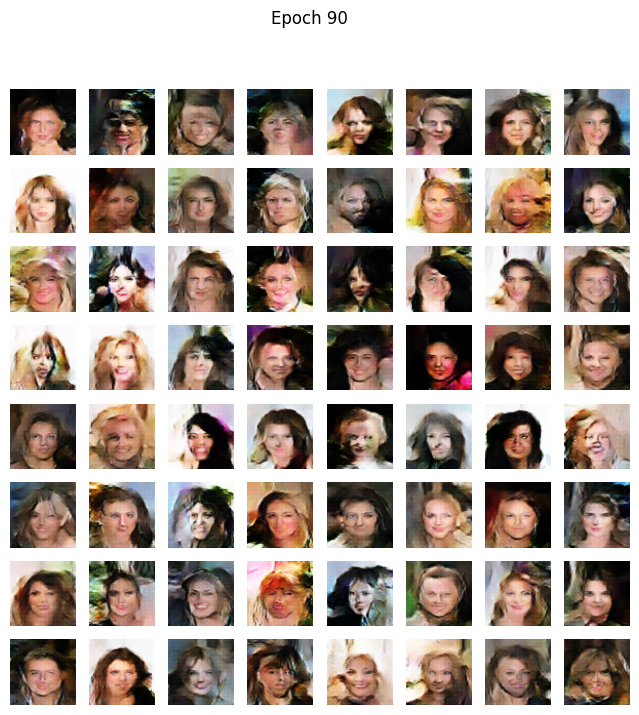

Epoch 91/100 | Generator Loss: 1.2745 | Discriminator Loss: 0.9966
Epoch 92/100 | Generator Loss: 1.2896 | Discriminator Loss: 0.9812
Epoch 93/100 | Generator Loss: 1.3057 | Discriminator Loss: 0.9815
Epoch 94/100 | Generator Loss: 1.2557 | Discriminator Loss: 0.9958
Epoch 95/100 | Generator Loss: 1.2749 | Discriminator Loss: 0.9815


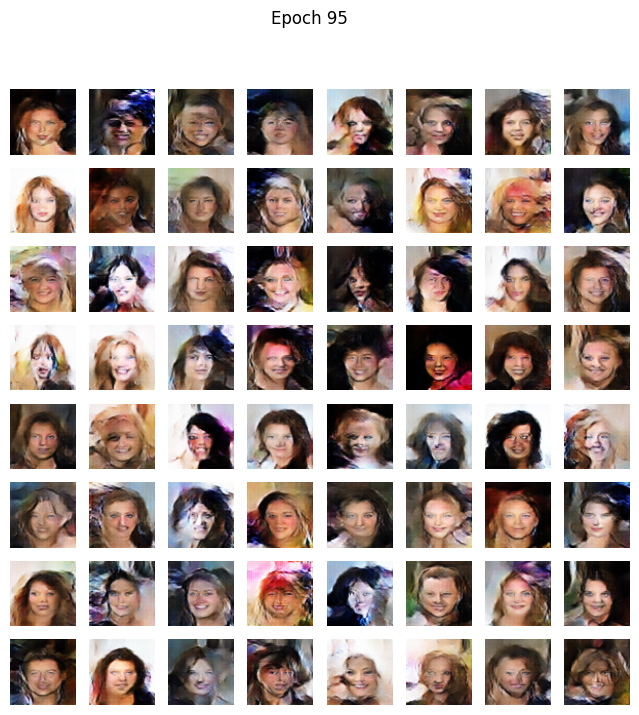

Epoch 96/100 | Generator Loss: 1.2958 | Discriminator Loss: 0.9696
Epoch 97/100 | Generator Loss: 1.2953 | Discriminator Loss: 0.9876
Epoch 98/100 | Generator Loss: 1.2930 | Discriminator Loss: 0.9869
Epoch 99/100 | Generator Loss: 1.2741 | Discriminator Loss: 0.9877
Epoch 100/100 | Generator Loss: 1.2871 | Discriminator Loss: 1.0040


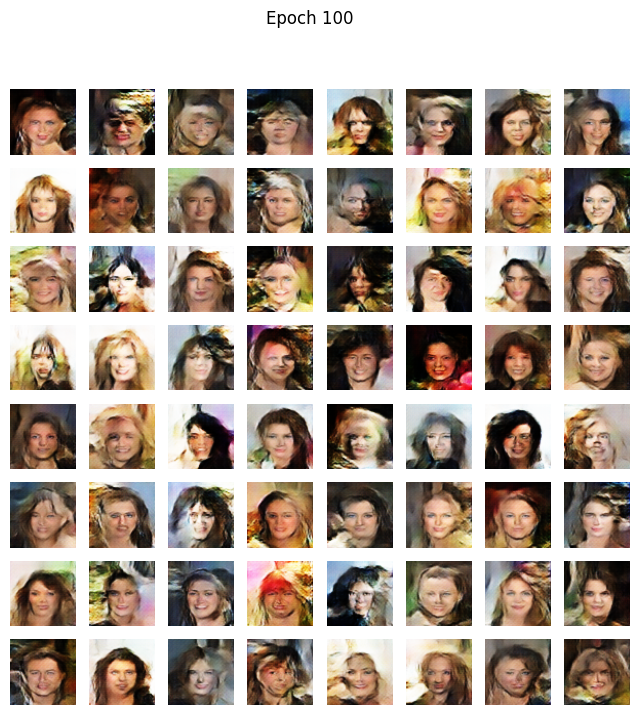

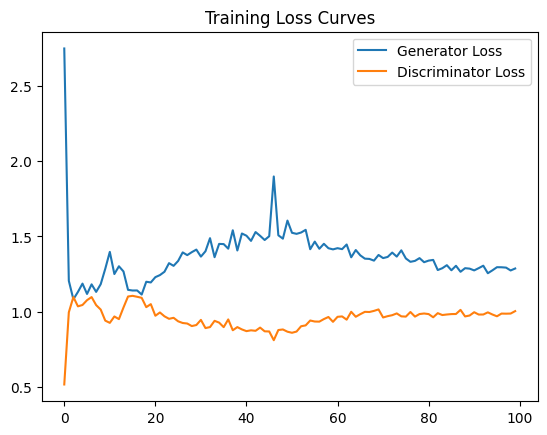

In [10]:

gen_losses, disc_losses = [], []
seed = tf.random.normal([64, LATENT_DIM])
seed_labels = tf.ones((64, 1))  # Generate long hair images

def generate_and_plot_images(model, epoch, save=True):
    predictions = model([seed, seed_labels], training=False)
    predictions = (predictions + 1) / 2.0
    fig = plt.figure(figsize=(8, 8))
    for i in range(predictions.shape[0]):
        plt.subplot(8, 8, i+1)
        plt.imshow(predictions[i])
        plt.axis('off')
    plt.suptitle(f"Epoch {epoch}")
    plt.show()

def train(images, conditions, epochs):
    dataset = tf.data.Dataset.from_tensor_slices((images, conditions)).shuffle(1000).batch(BATCH_SIZE)
    for epoch in range(1, epochs + 1):
        g_loss_epoch, d_loss_epoch = 0, 0
        for img_batch, lbl_batch in dataset:
            g_loss, d_loss = train_step(img_batch, lbl_batch)
            g_loss_epoch += g_loss
            d_loss_epoch += d_loss

        avg_g = g_loss_epoch / len(dataset)
        avg_d = d_loss_epoch / len(dataset)
        gen_losses.append(avg_g)
        disc_losses.append(avg_d)

        print(f"Epoch {epoch}/{epochs} | Generator Loss: {avg_g:.4f} | Discriminator Loss: {avg_d:.4f}")

        if epoch % 5 == 0 or epoch == 1:
          generate_and_plot_images(generator, epoch)

    # Final plot
    plt.plot(gen_losses, label='Generator Loss')
    plt.plot(disc_losses, label='Discriminator Loss')
    plt.legend()
    plt.title('Training Loss Curves')
    plt.show()

train(images, conditions, EPOCHS)
